## 10.1

Choose **ONLY ONE** of the two following possibilities:

1. Parallelize with MPI libraries your Genetic Algorithm code in order to solve the TSP by performing a *Genetic Search* with (up to) 11 **parallel GA searches of the optimal path**:
each node should perform an independent GA search, the so-called *Continent*, **but** every $N_{migr}$ generations the *Continents* should exchange their best individuals randomly.

2. Starting from your Genetic Algorithm code implement a **Parallel Tempering algorithm** (Simulated Annealing with many temperatures). Parallelize with MPI libraries your algorithm in order to solve the TSP where each computing node, up to 11, is characterized by a different temperature or a limited set of temperatures (if you need more than 11 temperatures). Use your genetic operators (except crossover) as trial moves for the Metropolis algorithm and **add a trial move that proposes an exchange of paths among adjacent temperatures (nodes)** (see lecture 8 for the acceptance formula). The candidate solution of the TSP will appear on the node with the lower temperature.

## Parallelization
Parallelization is the process of breaking down a problem into smaller subproblems that can be executed simultaneously on multiple processors or computing cores. This makes it possible to fully utilize the available computational resources, reducing overall execution time and enabling the solution of larger or more complex tasks. Such an approach can be implemented using parallel programming models, such as MPI (Message Passing Interface).


## The MPI Library
MPI (Message Passing Interface) is a C++ library designed to handle communication and coordination between processes running in parallel. An MPI program is made up of multiple processes that interact with each other by exchanging messages. Every process is assigned a unique identifier, called a rank, which is used to distinguish it during communication. The MPI library provides a wide range of functions for process management, message passing, and synchronization. Among its main features are sending and receiving messages, reducing data, distributing and gathering information, synchronizing execution, and more.

The MPI commands I worked with are:
* *int MPI_Init(int *argc, char argv): Initializes the MPI environment and must be invoked at the very start of an MPI program, before any other MPI call. It takes two arguments: a pointer to the command-line argument count (argc) and a pointer to the array of command-line arguments (argv). This function sets up the environment and configures the processes for MPI execution.
* int MPI_Comm_size(MPI_Comm comm, int size): Determines the total number of processes within the communicator comm and stores the value in the variable size. In most cases, the communicator used is MPI_COMM_WORLD, which includes all active processes.
* int MPI_Comm_rank(MPI_Comm comm, int rank): Retrieves the rank of the calling process within the communicator comm and assigns it to the variable rank. The rank uniquely identifies each process in the communicator.
* int MPI_Bcast(void buffer, int count, MPI_Datatype datatype, int root, MPI_Comm comm): Broadcasts data from a designated root process to all other processes within a communicator. The buffer is a pointer to the data to be shared, count specifies the number of elements, datatype indicates the type of data (typically a predefined MPI type), root is the rank of the process sending the data, and comm defines the group of processes participating in the broadcast.


### Implementation
I decided to follow the first approach: parallelizing the Genetic Algorithm using MPI to solve the Traveling Salesman Problem (TSP) by 
running 5 independent GA searches in parallel. Each process executes its own GA search, referred to as a Continent, and after every 
N_migr generations, the Continents exchange their best individuals in a randomized way.

Building on the code developed in exercise 9, the main modifications were made in the ```main.cpp``` file. Here, I introduced MPI initialization and designed a mechanism 
for the nodes to exchange information every N_migr generations.

Each process instantiates its own ```TSP``` object and evolves the population using the ```tsp.evolution()``` method. At every N_migr step, each process saves its 
best solution into the variable migrator. All processes then send their migrator to rank 0 using MPI_Gather. Rank 0 collects these solutions in a matrix, 
shuffles their order randomly, and redistributes them to all processes through ```MPI_Bcast```. Each process then updates its best path by selecting the entry in 
the matrix corresponding to its own rank.

To handle this exchange, two additional methods are used: ```tsp.get_best_travel()``` to extract the current best solution and ```tsp.set_best_travel()```
to replace it with the new one. These methods were designed specifically for the parallelized version of the code and are straightforward in purpose. Below is the relevant section of the main.cpp file where the migration mechanism is implemented:
```cpp
if (i % tsp.getMigrationStep() == 0 && i != 0) {
            cout << "Rank" << rank << ": Migrating individuals..." << endl;
            migrator = tsp.getbestTravel(i);
            MPI_Barrier(MPI_COMM_WORLD);
            MPI_Gather(migrator.memptr(), nCities, MPI_INT, migrators.memptr(), nCities, MPI_INT, 0, MPI_COMM_WORLD);
           
            if(rank==0)
                migrators = arma::shuffle(migrators);
            MPI_Barrier(MPI_COMM_WORLD);
            MPI_Bcast(migrators.memptr(), nCities * 2, MPI_INT, 0, MPI_COMM_WORLD);

            tsp.set_best_travel(migrator);
            if (rank < 4)
                tsp.bestTravel(i);
           
            tsp.loss();
        }
```

I also had to make sure that the rest of the code worked properly with this new data flow. First, I adjusted the initialization of the ranks to ensure that they used statistically uncorrelated pseudorandom number sequences. In addition, I introduced a **MIGRATION\_STEP** parameter in the `input.dat` file to allow for easy modification of this setting. Finally, I added the necessary functions to read from file the list of cities to be connected.


In [42]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os

In [ ]:
def read_output_file(filename):
    points = []
    loss = None
    
    try:
        with open(filename, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            line = line.strip()
            if line.startswith("Loss:"):
                loss = float(line.split(":")[1].strip())
            elif line and not line.startswith("Partial results"):
                coords = line.split()
                if len(coords) == 2:
                    x, y = float(coords[0]), float(coords[1])
                    points.append((x, y))
    except:
        return [], None
    
    return points, loss

def create_tsp_animation(output_dir):
    generations = list(range(0, 300, 10))
    all_data = []
    
    for gen in generations:
        filename = os.path.join(output_dir, f"output{gen}.txt")
        if os.path.exists(filename):
            points, loss = read_output_file(filename)
            if points and loss is not None:
                all_data.append((gen, points, loss))
    
    if not all_data:
        print("Nessun dato trovato!")
        return
    
    # Setup della figura
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Calcola i limiti globali per mantenere la scala fissa
    all_points = [point for _, points, _ in all_data for point in points]
    all_x = [p[0] for p in all_points]
    all_y = [p[1] for p in all_points]
    margin = (max(all_x) - min(all_x)) * 0.05
    
    ax.set_xlim(min(all_x) - margin, max(all_x) + margin)
    ax.set_ylim(min(all_y) - margin, max(all_y) + margin)
    
    # Elementi del plot che verranno aggiornati
    line, = ax.plot([], [], 'o-', color='#2E86AB', linewidth=2.5, markersize=8, alpha=0.8)
    start_point, = ax.plot([], [], 'o', color='#A23B72', markersize=12, zorder=5)
    
    # Styling
    ax.set_xlabel('X Coordinate', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y Coordinate', fontsize=12, fontweight='bold')
    ax.tick_params(labelsize=10)
    
    # Title che verrà aggiornato
    title = ax.set_title('', fontsize=16, fontweight='bold', pad=20)
    
    def animate(frame):
        """Funzione di animazione."""
        gen, points, loss = all_data[frame]
        
        if not points:
            return line, start_point, title
        
        # Prepara le coordinate (chiude il ciclo)
        x_coords = [p[0] for p in points] + [points[0][0]]
        y_coords = [p[1] for p in points] + [points[0][1]]
        
        # Aggiorna la linea e i punti
        line.set_data(x_coords, y_coords)
        
        # Aggiorna il punto di partenza
        start_point.set_data([points[0][0]], [points[0][1]])
        
        # Aggiorna il titolo
        title.set_text(f'TSP Evolution - Generation {gen} | Loss: {loss:.2f}')
        
        return line, start_point, title
    
    # Crea l'animazione
    anim = animation.FuncAnimation(
        fig, animate, frames=len(all_data), 
        interval=600, blit=True, repeat=True
    )
    
    # Aggiungi una legenda
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='#2E86AB', linewidth=2.5, 
                  markersize=8, label='Cities & Route'),
        plt.Line2D([0], [0], marker='o', color='#A23B72', linewidth=0, 
                  markersize=12, label='Start/End Point')
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=11)
    
    plt.tight_layout()
    return anim


# CIRCLE

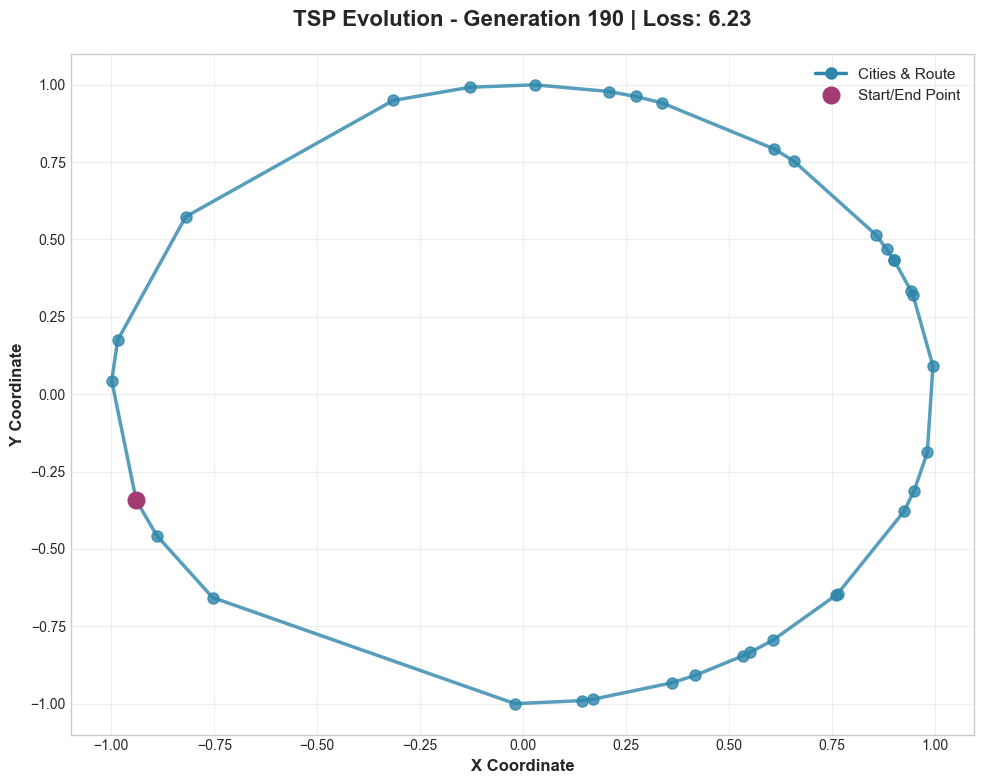

In [44]:
# Esegui l'animazione
anim = create_tsp_animation(output_dir="/Users/marta/Documents/LSN/10/10.1/OUTPUTCIRCLE/")

from IPython.display import HTML
HTML(anim.to_jshtml())

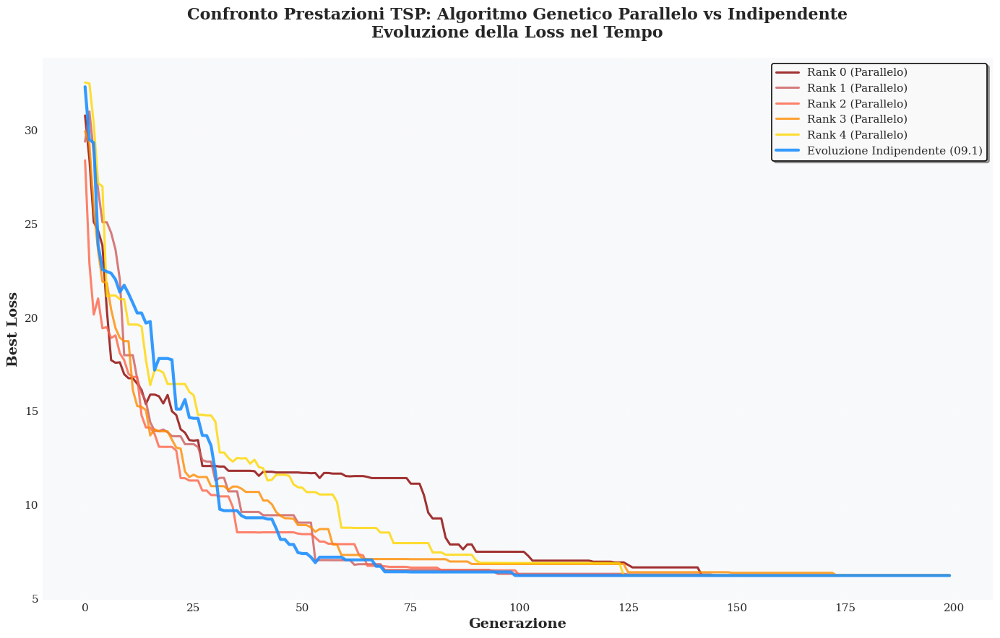


📊 COMPARISON
Best parallel loss: 6.2344
Medium parallel loss: 6.2344
Independent loss: 6.2310

🏆 The independent algorithm is 0.1% better!

RATIO:
  • Rank 0: 0.202
  • Rank 1: 0.212
  • Rank 2: 0.220
  • Rank 3: 0.208
  • Rank 4: 0.192
  • Indipendent: 0.193



In [45]:
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'figure.titlesize': 18,
    'lines.linewidth': 2.5,
    'axes.grid': True,
    'grid.alpha': 0.3
})

warm_colors = ['#8B0000', '#CD5C5C', '#FF6347', '#FF8C00', '#FFD700']
cool_color = '#1E90FF'

plt.figure(figsize=(14, 9))

rank_data = []
for rank in range(5):
    try:
        filename = f'/Users/marta/Documents/LSN/10/10.1/OUTPUTCIRCLE/loss{rank}.txt'
        data = np.loadtxt(filename)
        generations = data[:, 0]
        losses = data[:, 1]
        rank_data.append((generations, losses))
        
        plt.plot(generations, losses, 
                color=warm_colors[rank], 
                linewidth=2.2,
                label=f'Rank {rank} (Parallelo)', 
                alpha=0.8)
                
    except FileNotFoundError:
        print(f"Warning: File loss{rank}.txt non trovato")
    except Exception as e:
        print(f"Errore nel caricamento rank {rank}: {e}")

try:
    data_independent = np.loadtxt('/Users/marta/Documents/LSN/09/09.1/OUTPUTCIRCLE/loss.txt')
    generations_independent = data_independent[:, 0]
    losses_independent = data_independent[:, 1]
    
    plt.plot(generations_independent, losses_independent, 
            color=cool_color,
            linewidth=3,
            label='Evoluzione Indipendente (09.1)', 
            alpha=0.9,
            linestyle='-')
            
except FileNotFoundError:
    print("Warning: File dell'evoluzione indipendente non trovato")
except Exception as e:
    print(f"Errore nel caricamento dati indipendenti: {e}")

plt.xlabel('Generazione', fontweight='bold')
plt.ylabel('Best Loss', fontweight='bold')
plt.title('Confronto Prestazioni TSP: Algoritmo Genetico Parallelo vs Indipendente\n'
          'Evoluzione della Loss nel Tempo', 
          fontweight='bold', pad=20)

legend = plt.legend(loc='upper right', 
                   frameon=True, 
                   fancybox=True, 
                   shadow=True,
                   framealpha=0.95,
                   edgecolor='black',
                   facecolor='white',
                   ncol=1)
legend.get_frame().set_linewidth(1.2)

plt.grid(True, alpha=0.3, linestyle='-', linewidth=0.8)
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().patch.set_facecolor('white')

plt.gca().tick_params(axis='both', which='major', labelsize=11, width=1.2)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.2)
plt.gca().spines['bottom'].set_linewidth(1.2)


plt.tight_layout()
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUTCIRCLE/tsp_comparison_parallel.png', 
            dpi=300, 
            bbox_inches='tight', 
            facecolor='white',
            edgecolor='none')
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUTCIRCLE/tsp_comparison_parallel.pdf', 
            bbox_inches='tight', 
            facecolor='white')

plt.show()

# ========== STATISTICHE ==========
best_parallel_losses = []
for rank, (generations, losses) in enumerate(rank_data):
    if len(losses) > 0:
        initial_loss = losses[0]
        final_loss = losses[-1]
        best_loss = min(losses)
        improvement = ((initial_loss - final_loss) / initial_loss * 100)
        
        best_parallel_losses.append(best_loss)

try:
    initial_loss_ind = losses_independent[0]
    final_loss_ind = losses_independent[-1]
    best_loss_ind = min(losses_independent)
    improvement_ind = ((initial_loss_ind - final_loss_ind) / initial_loss_ind * 100)
    
    print("\n" + "="*60)
    print("📊 COMPARISON")
    print("="*60)
    
    if best_parallel_losses:
        best_parallel_overall = min(best_parallel_losses)
        avg_parallel = np.mean(best_parallel_losses)
        
        print(f"Best parallel loss: {best_parallel_overall:.4f}")
        print(f"Medium parallel loss: {avg_parallel:.4f}")
        print(f"Independent loss: {best_loss_ind:.4f}")
        
        if best_parallel_overall < best_loss_ind:
            improvement = ((best_loss_ind - best_parallel_overall) / best_loss_ind * 100)
            print(f"\n🏆 The parallel algorithm is {improvement:.1f}% better!")
        else:
            improvement = ((best_parallel_overall - best_loss_ind) / best_parallel_overall * 100)
            print(f"\n🏆 The independent algorithm is {improvement:.1f}% better!")
            
        # Analisi convergenza
        print(f"\nRATIO:")
        for rank, (_, losses) in enumerate(rank_data):
            if len(losses) > 0:
                ratio = losses[-1] / losses[0]
                print(f"  • Rank {rank}: {ratio:.3f}")
        
        ratio_ind = final_loss_ind / initial_loss_ind
        print(f"  • Indipendent: {ratio_ind:.3f}")
        
except NameError:
    print("Dati dell'evoluzione indipendente non disponibili per il confronto")

print("\n" + "="*60)


The **circle scenario** had already proven to be relatively easy to converge on a single core, and indeed the use of a parallel search with migrations only provided a slight improvement in convergence. After **500 generations**, both approaches reached convergence. The parallel version with migrations achieved a somewhat lower loss, but the difference was marginal. Even after **50 evolutions**, the improvement was not particularly noticeable.


# SQUARE

Even in the square case, the differences are not substantial, as shown in the final loss plot. What is more interesting to compare are the animations of the two searches. The one below corresponds to the parallel computation, while the previous lesson’s notebook shows the independent computation. It is clear that the search dynamics are completely different.

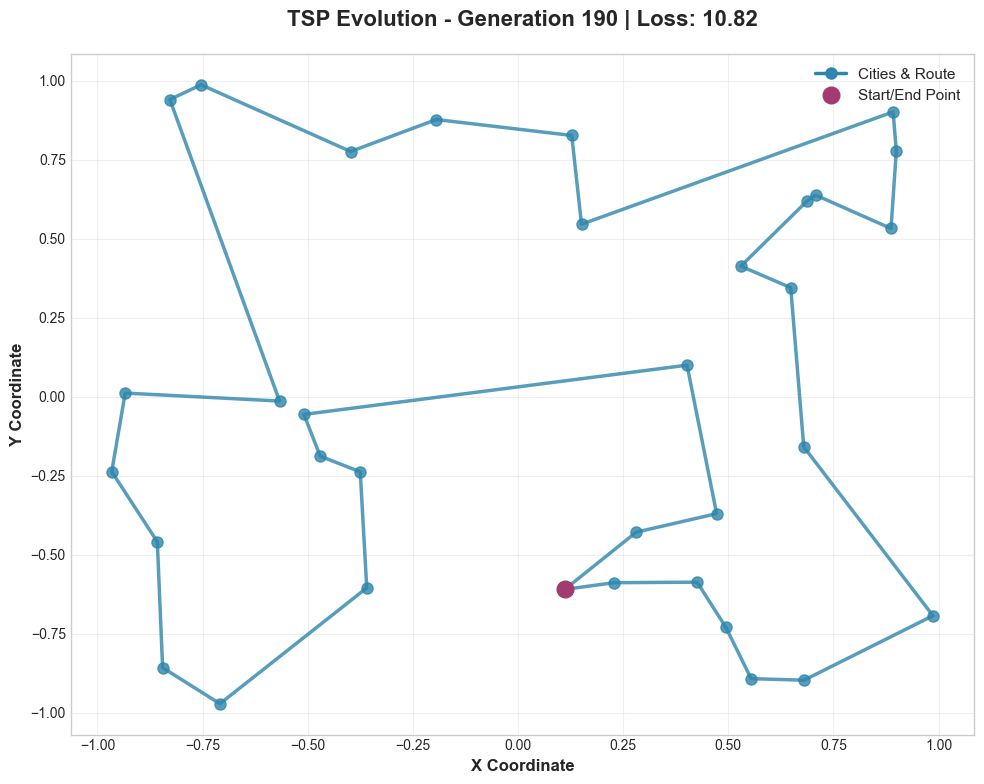

In [46]:
# Esegui l'animazione
anim = create_tsp_animation(output_dir="/Users/marta/Documents/LSN/10/10.1/OUTPUTSQUARE/")

from IPython.display import HTML
HTML(anim.to_jshtml())

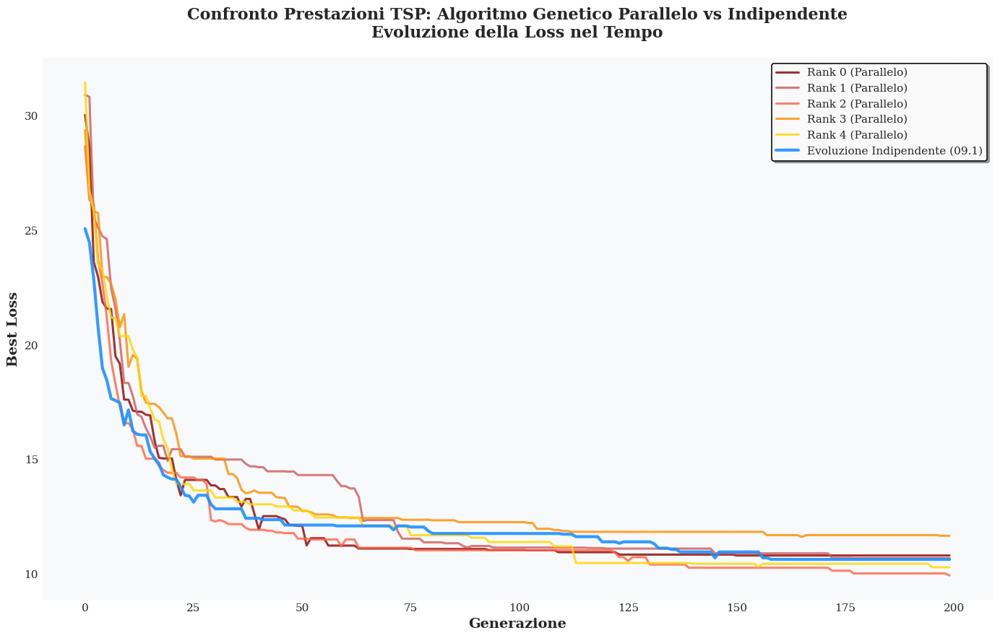


📊 COMPARISON
Best parallel loss: 9.9426
Medium parallel loss: 10.6770
Independent loss: 10.6459

🏆 The parallel algorithm is 6.6% better!

RATIO:
  • Rank 0: 0.360
  • Rank 1: 0.346
  • Rank 2: 0.347
  • Rank 3: 0.397
  • Rank 4: 0.328
  • Indipendent: 0.425



In [ ]:
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'figure.titlesize': 18,
    'lines.linewidth': 2.5,
    'axes.grid': True,
    'grid.alpha': 0.3
})

warm_colors = ['#8B0000', '#CD5C5C', '#FF6347', '#FF8C00', '#FFD700']
cool_color = '#1E90FF'

plt.figure(figsize=(14, 9))

rank_data = []
for rank in range(5):
    try:
        filename = f'/Users/marta/Documents/LSN/10/10.1/OUTPUTSQUARE/loss{rank}.txt'
        data = np.loadtxt(filename)
        generations = data[:, 0]
        losses = data[:, 1]
        rank_data.append((generations, losses))
        
        plt.plot(generations, losses, 
                color=warm_colors[rank], 
                linewidth=2.2,
                label=f'Rank {rank} (Parallelo)', 
                alpha=0.8)
                
    except FileNotFoundError:
        print(f"Warning: File loss{rank}.txt non trovato")
    except Exception as e:
        print(f"Errore nel caricamento rank {rank}: {e}")

try:
    data_independent = np.loadtxt('/Users/marta/Documents/LSN/09/09.1/OUTPUTSQUARE/loss.txt')
    generations_independent = data_independent[:, 0]
    losses_independent = data_independent[:, 1]
    
    plt.plot(generations_independent, losses_independent, 
            color=cool_color,
            linewidth=3,
            label='Evoluzione Indipendente (09.1)', 
            alpha=0.9,
            linestyle='-')
            
except FileNotFoundError:
    print("Warning: File dell'evoluzione indipendente non trovato")
except Exception as e:
    print(f"Errore nel caricamento dati indipendenti: {e}")

plt.xlabel('Generazione', fontweight='bold')
plt.ylabel('Best Loss', fontweight='bold')
plt.title('Confronto Prestazioni TSP: Algoritmo Genetico Parallelo vs Indipendente\n'
          'Evoluzione della Loss nel Tempo', 
          fontweight='bold', pad=20)

legend = plt.legend(loc='upper right', 
                   frameon=True, 
                   fancybox=True, 
                   shadow=True,
                   framealpha=0.95,
                   edgecolor='black',
                   facecolor='white',
                   ncol=1)
legend.get_frame().set_linewidth(1.2)

plt.grid(True, alpha=0.3, linestyle='-', linewidth=0.8)
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().patch.set_facecolor('white')

plt.gca().tick_params(axis='both', which='major', labelsize=11, width=1.2)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.2)
plt.gca().spines['bottom'].set_linewidth(1.2)


plt.tight_layout()
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUT/tsp_comparison_parallel.png', 
            dpi=300, 
            bbox_inches='tight', 
            facecolor='white',
            edgecolor='none')
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUT/tsp_comparison_parallel.pdf', 
            bbox_inches='tight', 
            facecolor='white')

plt.show()

# ========== STATISTICHE ==========
best_parallel_losses = []
for rank, (generations, losses) in enumerate(rank_data):
    if len(losses) > 0:
        initial_loss = losses[0]
        final_loss = losses[-1]
        best_loss = min(losses)
        improvement = ((initial_loss - final_loss) / initial_loss * 100)
        
        best_parallel_losses.append(best_loss)

try:
    initial_loss_ind = losses_independent[0]
    final_loss_ind = losses_independent[-1]
    best_loss_ind = min(losses_independent)
    improvement_ind = ((initial_loss_ind - final_loss_ind) / initial_loss_ind * 100)
    
    print("\n" + "="*60)
    print("📊 COMPARISON")
    print("="*60)
    
    if best_parallel_losses:
        best_parallel_overall = min(best_parallel_losses)
        avg_parallel = np.mean(best_parallel_losses)
        
        print(f"Best parallel loss: {best_parallel_overall:.4f}")
        print(f"Medium parallel loss: {avg_parallel:.4f}")
        print(f"Independent loss: {best_loss_ind:.4f}")
        
        if best_parallel_overall < best_loss_ind:
            improvement = ((best_loss_ind - best_parallel_overall) / best_loss_ind * 100)
            print(f"\n🏆 The parallel algorithm is {improvement:.1f}% better!")
        else:
            improvement = ((best_parallel_overall - best_loss_ind) / best_parallel_overall * 100)
            print(f"\n🏆 The independent algorithm is {improvement:.1f}% better!")
            
        # Analisi convergenza
        print(f"\nRATIO:")
        for rank, (_, losses) in enumerate(rank_data):
            if len(losses) > 0:
                ratio = losses[-1] / losses[0]
                print(f"  • Rank {rank}: {ratio:.3f}")
        
        ratio_ind = final_loss_ind / initial_loss_ind
        print(f"  • Indipendent: {ratio_ind:.3f}")
        
except NameError:
    print("Dati dell'evoluzione indipendente non disponibili per il confronto")

print("\n" + "="*60)

### Conclusion

the results obtained with the parallelization were not substantially superior to those obtained with independent searches. This limitation is likely related to the relatively small number of nodes employed. 
It is reasonable to expect that, with a larger set of nodes, the parallel search with migrations could achieve lower loss values 
and faster convergence, thereby enhancing the overall effectiveness of the algorithm.


# 10.2

Apply your parallel code to the TSP problem for 110 italian "capoluoghi di provincia" longitude and latitude coordinates in the *cap_prov_ita.dat* file.

If your choice in Exercise 10.1 is option 1, do you improve with respect using the same number of computing cores but with **independent GA searches** ?

Here, the complexity of the problem increases considerably. The number of cities rises to **110**, which greatly expands the space of possible paths that the optimization must explore. As with the circle and square scenarios, I will present the solutions obtained through both the parallel search with migrations and the independent search. The results show that the migration nodes tend to converge to very similar paths, whereas the independent nodes achieve reasonable solutions but follow noticeably different routes. Finally, it is also insightful to examine the evolution of the path length over time, plotted as the loss.


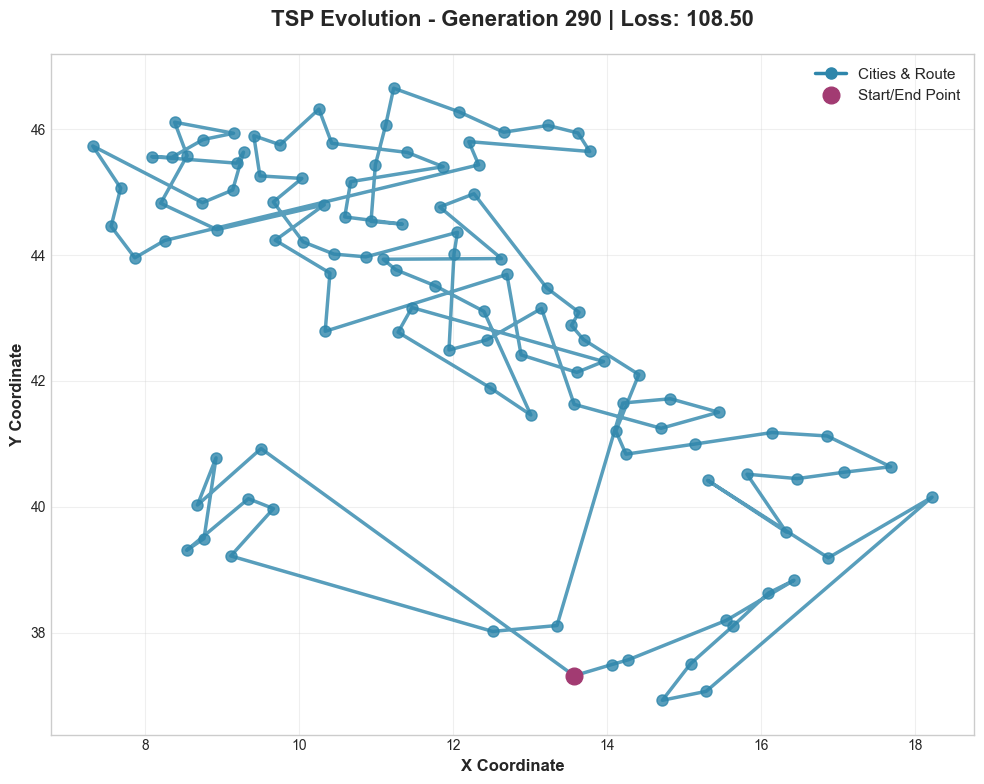

In [48]:
# Esegui l'animazione
anim = create_tsp_animation(output_dir="/Users/marta/Documents/LSN/10/10.1/OUTPUTITALY/")

from IPython.display import HTML
HTML(anim.to_jshtml())

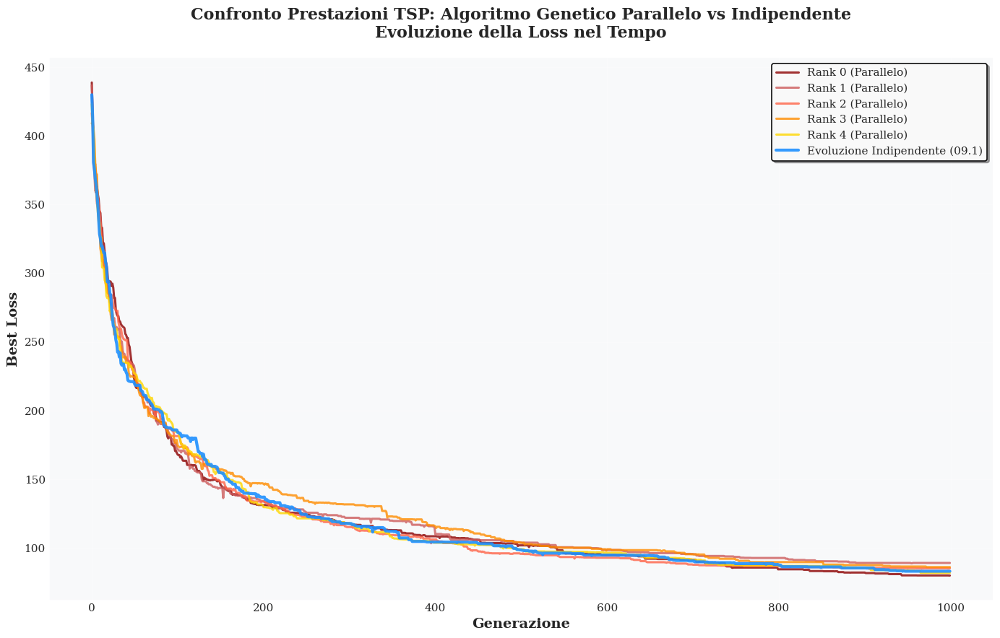


📊 COMPARISON
Best parallel loss: 80.0710
Medium parallel loss: 84.4436
Indipendent loss : 83.1777

🏆 The parallel algorithm is 3.7% better!

RATIO
  • Rank 0: 0.182
  • Rank 1: 0.204
  • Rank 2: 0.205
  • Rank 3: 0.211
  • Rank 4: 0.194
  • Indipendent: 0.194



In [49]:
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'figure.titlesize': 18,
    'lines.linewidth': 2.5,
    'axes.grid': True,
    'grid.alpha': 0.3
})

warm_colors = ['#8B0000', '#CD5C5C', '#FF6347', '#FF8C00', '#FFD700']
cool_color = '#1E90FF'

plt.figure(figsize=(14, 9))

rank_data = []
for rank in range(5):
    try:
        filename = f'/Users/marta/Documents/LSN/10/10.1/OUTPUT/loss{rank}.txt'
        data = np.loadtxt(filename)
        generations = data[:, 0]
        losses = data[:, 1]
        rank_data.append((generations, losses))
        
        plt.plot(generations, losses, 
                color=warm_colors[rank], 
                linewidth=2.2,
                label=f'Rank {rank} (Parallelo)', 
                alpha=0.8)
                
    except FileNotFoundError:
        print(f"Warning: File loss{rank}.txt non trovato")
    except Exception as e:
        print(f"Errore nel caricamento rank {rank}: {e}")

try:
    data_independent = np.loadtxt('/Users/marta/Documents/LSN/10/10.1/code_adaptation/OUTPUT/loss.txt')
    generations_independent = data_independent[:, 0]
    losses_independent = data_independent[:, 1]
    
    plt.plot(generations_independent, losses_independent, 
            color=cool_color,
            linewidth=3,
            label='Evoluzione Indipendente (09.1)', 
            alpha=0.9,
            linestyle='-')
            
except FileNotFoundError:
    print("Warning: File dell'evoluzione indipendente non trovato")
except Exception as e:
    print(f"Errore nel caricamento dati indipendenti: {e}")

plt.xlabel('Generazione', fontweight='bold')
plt.ylabel('Best Loss', fontweight='bold')
plt.title('Confronto Prestazioni TSP: Algoritmo Genetico Parallelo vs Indipendente\n'
          'Evoluzione della Loss nel Tempo', 
          fontweight='bold', pad=20)

legend = plt.legend(loc='upper right', 
                   frameon=True, 
                   fancybox=True, 
                   shadow=True,
                   framealpha=0.95,
                   edgecolor='black',
                   facecolor='white',
                   ncol=1)
legend.get_frame().set_linewidth(1.2)

plt.grid(True, alpha=0.3, linestyle='-', linewidth=0.8)
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().patch.set_facecolor('white')

plt.gca().tick_params(axis='both', which='major', labelsize=11, width=1.2)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.2)
plt.gca().spines['bottom'].set_linewidth(1.2)


plt.tight_layout()
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUTITALY/tsp_comparison_parallel.png', 
            dpi=300, 
            bbox_inches='tight', 
            facecolor='white',
            edgecolor='none')
plt.savefig('/Users/marta/Documents/LSN/10/10.1/OUTPUTITALY/tsp_comparison_parallel.pdf', 
            bbox_inches='tight', 
            facecolor='white')

plt.show()

# ========== STATISTICHE ==========

best_parallel_losses = []
for rank, (generations, losses) in enumerate(rank_data):
    if len(losses) > 0:
        initial_loss = losses[0]
        final_loss = losses[-1]
        best_loss = min(losses)
        improvement = ((initial_loss - final_loss) / initial_loss * 100)
        
        best_parallel_losses.append(best_loss)

try:
    initial_loss_ind = losses_independent[0]
    final_loss_ind = losses_independent[-1]
    best_loss_ind = min(losses_independent)
    improvement_ind = ((initial_loss_ind - final_loss_ind) / initial_loss_ind * 100)
    
    print("\n" + "="*60)
    print("📊 COMPARISON")
    print("="*60)
    
    if best_parallel_losses:
        best_parallel_overall = min(best_parallel_losses)
        avg_parallel = np.mean(best_parallel_losses)
        
        print(f"Best parallel loss: {best_parallel_overall:.4f}")
        print(f"Medium parallel loss: {avg_parallel:.4f}")
        print(f"Indipendent loss : {best_loss_ind:.4f}")
        
        if best_parallel_overall < best_loss_ind:
            improvement = ((best_loss_ind - best_parallel_overall) / best_loss_ind * 100)
            print(f"\n🏆 The parallel algorithm is {improvement:.1f}% better!")
        else:
            improvement = ((best_parallel_overall - best_loss_ind) / best_parallel_overall * 100)
            print(f"\n🏆 The independent algorithm is {improvement:.1f}% better!")
            
        # Analisi convergenza
        print(f"\nRATIO")
        for rank, (_, losses) in enumerate(rank_data):
            if len(losses) > 0:
                ratio = losses[-1] / losses[0]
                print(f"  • Rank {rank}: {ratio:.3f}")
        
        ratio_ind = final_loss_ind / initial_loss_ind
        print(f"  • Indipendent: {ratio_ind:.3f}")
        
except NameError:
    print("Dati dell'evoluzione indipendente non disponibili per il confronto")

print("\n" + "="*60)